# Spatial functional analysis

Spatial transcriptomics technologies yield many molecular readouts that are hard to interpret by themselves. One way of summarizing this information is by inferring biological activities from prior knowledge.

In this notebook we showcase how to use `decoupler` for transcription factor and pathway activity inference from a human data-set. The data consists of a 10X Genomics Visium slide of a human lymph node and it is available at their [website](https://www.10xgenomics.com/resources/datasets).

空間トランスクリプトミクス技術からは、それだけでは解釈が難しい多くの分子情報が得られる。この情報を要約する1つの方法は、事前知識から生物学的活性を推測することである。

このノートブックでは、ヒトのデータセットから転写因子とパスウェイの活性を推測するためにdecouplerを使用する方法を紹介します。データはヒトリンパ節の10倍Genomics Visiumスライドで、同社のウェブサイトから入手できる。

## Loading packages

First, we need to load the relevant packages, `scanpy` to handle RNA-seq data
and `decoupler` to use statistical methods.

まず、関連するパッケージ、RNA-seqデータを扱うscanpyと統計的手法を使うdecouplerをロードする必要がある。

In [1]:
# Only needed for processing
import numpy as np

In [2]:
import pandas as pd

In [3]:
import scanpy as sc

In [4]:
# Plotting options, change to your liking
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))

In [5]:
import decoupler as dc

In [71]:
import warnings
warnings.simplefilter('ignore', FutureWarning)

## Loading the data

We can download the data easily using `scanpy`:

データはscanpyを使って簡単にダウンロードできる：

In [6]:
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")

  0%|          | 0.00/7.86M [00:00<?, ?B/s]

  0%|          | 0.00/29.3M [00:00<?, ?B/s]

/Users/tomoya/mambaforge/envs/py_scvi/lib/python3.10/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/tomoya/mambaforge/envs/py_scvi/lib/python3.10/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [7]:
adata.var_names_make_unique()

In [8]:
adata

AnnData object with n_obs × n_vars = 4035 × 36601
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

### QC, projection and clustering


Here we follow the standard pre-processing steps as described in the [scanpy vignette](https://scanpy-tutorials.readthedocs.io/en/latest/spatial/basic-analysis.html).
These steps carry out the selection and filtration of spots based on 
quality control metrics and data normalization.

ここでは、scanpy vignetteに記載されている標準的な前処理ステップに従う。これらのステップでは、品質管理指標とデータの正規化に基づいたスポットの選択とフィルタリングを行う。

In [9]:
# Basic filtering
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=10)

In [10]:
# Normalize the data
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

Then we group spots based on the similarity of their transcription profiles. 
We can visualize the obtained clusters on a UMAP or directly at the tissue:

次に、転写プロファイルの類似性に基づいてスポットをグループ化する。得られたクラスターはUMAP上で、あるいは直接組織で可視化できる：

In [11]:
# Store norm counts
adata.layers['log_norm'] = adata.X.copy()

In [12]:
# Identify highly variable genes
sc.pp.highly_variable_genes(adata)

In [13]:
# Scale the data
sc.pp.scale(adata, max_value=10)

In [14]:
# Generate PCA features
sc.tl.pca(adata, svd_solver='arpack')

In [15]:
# Restore X to be norm counts
dc.swap_layer(adata, 'log_norm', X_layer_key=None, inplace=True)

In [16]:
# Compute distances in the PCA space, and find spot neighbors
sc.pp.neighbors(adata)

In [17]:
# Run leiden clustering algorithm
sc.tl.leiden(adata)

/var/folders/m6/rcnn0z4d7sv1fpq2r7xy3xyc0000gn/T/ipykernel_49054/2275028372.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


In [18]:
adata.obs['leiden'] = ['Clust. {0}'.format(i) for i in adata.obs['leiden']]

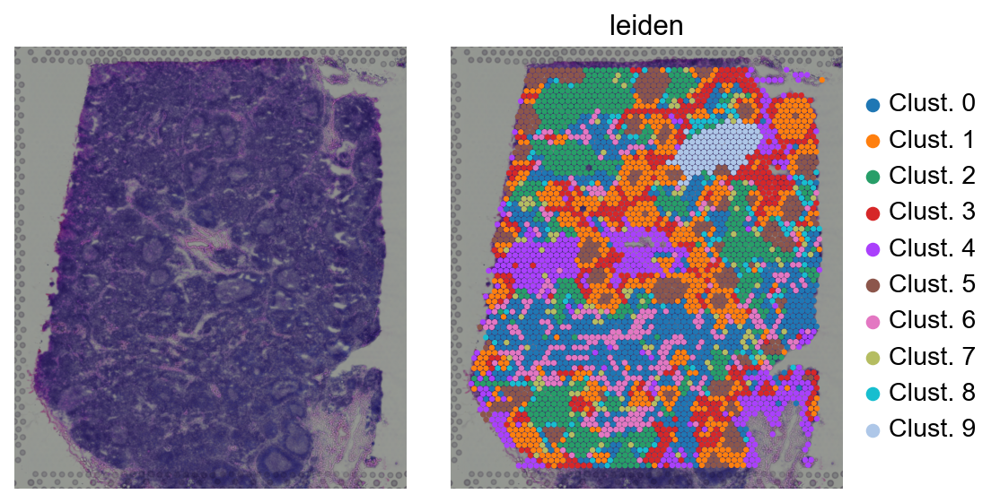

In [19]:
sc.pl.spatial(adata, color=[None, 'leiden'], size=1.5, wspace=0, frameon=False)

### Spatial Connectivity

Additionally, we can incorporate spatial information in our analyses by accounting for the spatial connectivity of our observations (in this case spots). By weighting the spatial proximity of our spots to the neighboring ones, we can transform our data to incorporate spatial context.

To generate spatial weights based on spatial proximity we will use `liana`. More information is available in this [vignette](https://liana-py.readthedocs.io/en/latest/notebooks/bivariate.html#Spatial-Connectivity).

さらに、オブザベーション（この場合はスポット）の空間的な連結性を考慮に入れることで、我々の分析に空間情報を組み入れることができる。スポットの空間的な近接性を近隣のスポットに重み付けすることで、空間的な文脈を組み込むようにデータを変換できる。

空間的な近接性に基づく空間的な重みを生成するために、lianaを使います。より詳しい情報はこのヴィネットをご覧ください。

In [21]:
import liana as li

In [22]:
li.ut.spatial_neighbors(
    adata,
    bandwidth=150,
    cutoff=0.1,
    kernel='gaussian',
    set_diag=True,
    standardize=True
)

In [23]:
# Plot the spatial weights of one spot in our object
adata.obs['conn'] = adata.obsp['spatial_connectivities'][0].A.ravel()

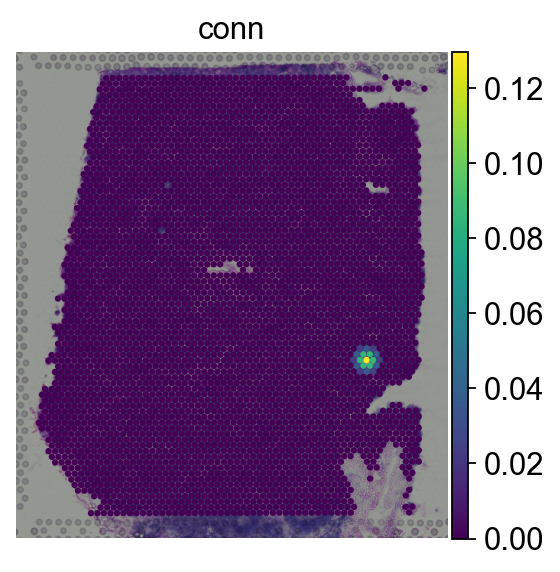

In [24]:
sc.pl.spatial(adata, color='conn', size=1.5, frameon=False)

We can see that for a given spot, the spatial weight is at its maximum on itself and decreases the more distant other spots are. Now we can spatially weight the gene expression values:

あるスポットに対して、空間的な重みはそれ自体で最大となり、他のスポットが遠くなるほど減少することがわかる。これで遺伝子発現値に空間的な重みをつけることができる：

In [25]:
# Update X with spatially weighted gene exression
adata.X = adata.obsp['spatial_connectivities'].A.dot(adata.X.A)

We can plot the original log-normalized counts with the new spatialy transformed values:

元の対数正規化されたカウントと、新しい空間変換された値をプロットすることができる：

In [26]:
genes = ['IFIT3', 'IGKC']

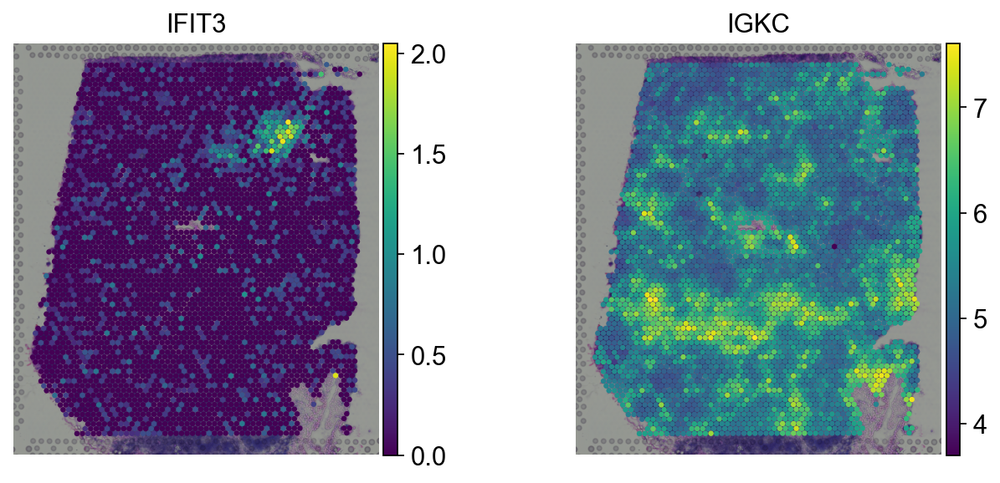

In [27]:
# Log-normalized counts
sc.pl.spatial(adata, color=genes, size=1.5, frameon=False, layer='log_norm')

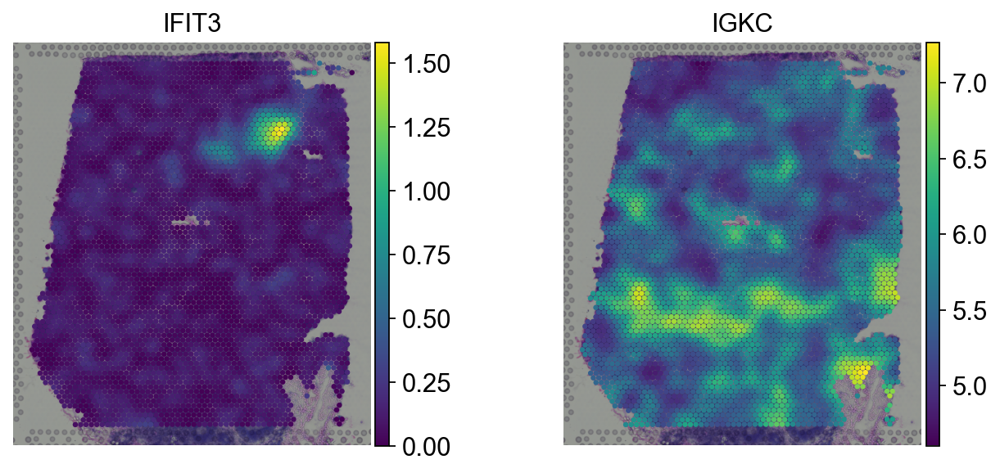

In [28]:
# Spatially weighted gene expression
sc.pl.spatial(adata, color=genes, size=1.5, frameon=False)

## Transcription factor activity inference

The first functional analysis we can perform is to infer transcription factor (TF) activities from our transcriptomics data. We will need a gene regulatory network (GRN) and a statistical method.

### CollecTRI network
[CollecTRI](https://github.com/saezlab/CollecTRI) is a comprehensive resource
containing a curated collection of TFs and their transcriptional targets
compiled from 12 different resources. This collection provides an increased
coverage of transcription factors and a superior performance in identifying
perturbed TFs compared to our previous
[DoRothEA](https://saezlab.github.io/dorothea/) network and other literature
based GRNs. Similar to DoRothEA, interactions are weighted by their mode of
regulation (activation or inhibition).

For this example we will use the human version (mouse and rat are also
available). We can use `decoupler` to retrieve it from `omnipath`. The argument
`split_complexes` keeps complexes or splits them into subunits, by default we
recommend to keep complexes together.

最初に行う機能解析は、トランスクリプトミクスデータから転写因子（TF）活性を推測することである。遺伝子制御ネットワーク（GRN）と統計的手法が必要です。

CollecTRIは、12の異なるリソースからコンパイルされたTFとその転写ターゲットのキュレーションコレクションを含む包括的なリソースです。このコレクションは、以前のDoRothEAネットワークや他の文献ベースのGRNと比較して、転写因子のカバレッジを高め、摂動TFの同定において優れたパフォーマンスを提供します。DoRothEAと同様に、相互作用はその調節様式（活性化または阻害）によって重み付けされる。

この例ではヒトのバージョンを使用する（マウスとラットも利用可能）。decouplerを使ってomnipathから取り出すことができる。引数split_complexesは複合体を保持するかサブユニットに分割するかを指定する。デフォルトでは複合体を保持することを推奨する。

In [29]:
net = dc.get_collectri(organism='human', split_complexes=False)

In [30]:
net.head()

,source,target,weight,PMID
0,MYC,TERT,1,10022128;10491298;10606235;10637317;10723141;1...
1,SPI1,BGLAP,1,10022617
2,SMAD3,JUN,1,10022869;12374795
3,SMAD4,JUN,1,10022869;12374795
4,STAT5A,IL2,1,10022878;11435608;17182565;17911616;22854263;2...


### Activity inference with Univariate Linear Model (ULM)

To infer TF enrichment scores we will run the Univariate Linear Model (`ulm`) method. For each spot in our slide (`adata`) and each TF in our network (`net`), it fits a linear model that predicts the observed gene expression
based solely on the TF's TF-Gene interaction weights. Once fitted, the obtained t-value of the slope is the score. If it is positive, we interpret that the TF is active and if it is negative we interpret that it is inactive.

To run `decoupler` methods, we need an input matrix (`mat`), an input prior knowledge
network/resource (`net`), and the name of the columns of `net` that we want to use.

TF濃縮スコアを推測するために、一変量線形モデル（ulm）法を実行する。スライドの各スポット(adata)とネットワークの各TF(net)について、TFのTF-遺伝子相互作用の重みのみに基づいて、観測された遺伝子発現を予測する線形モデルを当てはめる。フィッティング後、得られた傾きのt値がスコアとなる。これが正であればTFは活性であると解釈し、負であれば不活性であると解釈する。

decouplerを実行するには、入力行列(mat)、入力事前知識ネットワーク/リソース(net)、使用したいnetの列の名前が必要である。

In [31]:
dc.run_ulm(
    mat=adata,
    net=net,
    source='source',
    target='target',
    weight='weight',
    verbose=True,
    use_raw=False
)

Running ulm on mat with 4032 samples and 19813 targets for 714 sources.


The obtained scores (`ulm_estimate`) and p-values (`ulm_pvals`) are stored in the `.obsm` key:

得られたスコア(ulm_estimate)とp値(ulm_pvals)は.obsmキーに格納される：

In [32]:
adata.obsm['ulm_estimate'].head()

,ABL1,AHR,AIP,AIRE,AP1,APEX1,AR,ARID1A,ARID1B,ARID3A,...,ZNF382,ZNF384,ZNF395,ZNF423,ZNF436,ZNF699,ZNF76,ZNF804A,ZNF91,ZXDC
AAACAAGTATCTCCCA-1,2.506540,2.993418,-0.224612,1.088716,8.932041,3.467653,8.088827,0.097465,1.640160,1.590863,...,-2.141590,0.041472,0.137326,-1.132139,1.519211,2.201836,0.106273,-0.554477,1.577712,5.126571
AAACAATCTACTAGCA-1,1.861014,2.003173,-0.234753,0.840002,7.381738,2.214163,7.312596,-0.160331,1.457745,0.701439,...,-1.719986,-0.552123,-0.236104,-1.066292,1.508229,1.620677,0.599541,-0.930529,1.557906,4.704382
AAACACCAATAACTGC-1,2.365444,3.012575,-0.247704,1.302476,9.036440,3.478431,8.182928,0.190212,1.234261,1.334810,...,-1.935272,-0.352291,0.110648,-1.090288,1.026727,2.036324,0.634918,-0.373306,2.066460,4.922176
AAACAGAGCGACTCCT-1,1.333631,3.089249,-0.161767,1.122681,8.437885,3.095499,7.818811,-0.074081,2.859876,2.275511,...,-1.949704,-0.472414,1.141849,-1.144546,1.538650,1.718085,1.172972,0.167258,1.726077,4.207001
AAACAGCTTTCAGAAG-1,1.444055,2.606838,-0.424777,0.746851,7.309249,3.678788,6.895605,-0.038943,2.916240,2.473541,...,-1.677927,-0.270460,-0.091756,-1.113963,0.842818,1.549942,0.918053,0.020900,1.605347,4.549479


**Note**: Each run of `run_ulm` overwrites what is inside of `ulm_estimate` and `ulm_pvals`. if you want to run `ulm` with other resources and still keep the activities inside the same `AnnData` object, you can store the results in any other key in `.obsm` with different names, for example:

注：run_ulmを実行するたびに、ulm_estimateとulm_pvalsの中身が上書きされます。ulmを他のリソースで実行し、同じAnnDataオブジェクトの中にアクティビティを保持したい場合は、.obsmの他のキーに異なる名前で結果を保存することができます：

In [33]:
adata.obsm['collectri_ulm_estimate'] = adata.obsm['ulm_estimate'].copy()
adata.obsm['collectri_ulm_pvals'] = adata.obsm['ulm_pvals'].copy()

In [34]:
adata

AnnData object with n_obs × n_vars = 4032 × 19813
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes', 'leiden', 'conn'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'leiden_colors'
    obsm: 'spatial', 'X_pca', 'ulm_estimate', 'ulm_pvals', 'collectri_ulm_estimate', 'collectri_ulm_pvals'
    varm: 'PCs'
    layers: 'log_norm'
    obsp: 'distances', 'connectivities', 'spatial_connectivities'

### Visualization

To visualize the obtained scores, we can re-use many of `scanpy`'s plotting functions.
First though, we need to extract them from the `adata` object.

得られたスコアを視覚化するために、scanpyのプロット関数の多くを再利用することができます。しかし、最初にadataオブジェクトから得点を抽出する必要があります。

In [35]:
acts = dc.get_acts(adata, obsm_key='collectri_ulm_estimate')

In [36]:
acts

AnnData object with n_obs × n_vars = 4032 × 714
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes', 'leiden', 'conn'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'leiden_colors'
    obsm: 'spatial', 'X_pca', 'ulm_estimate', 'ulm_pvals', 'collectri_ulm_estimate', 'collectri_ulm_pvals'

`dc.get_acts` returns a new `AnnData` object which holds the obtained activities in its `.X` attribute, allowing us to re-use many `scanpy` functions, for example:

dc.get_actsは、取得したアクティビティを.X属性に保持する新しいAnnDataオブジェクトを返すので、例えば、多くのscanpy関数を再利用することができます：

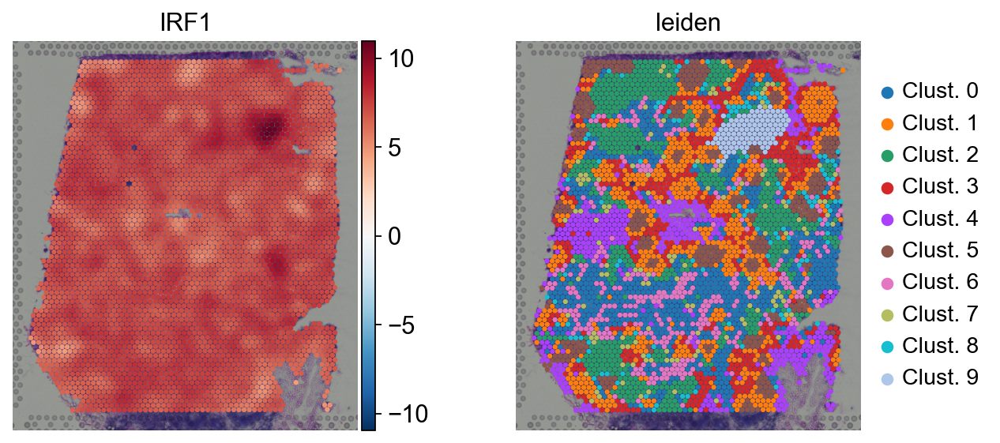

In [37]:
sc.pl.spatial(
    acts,
    color=['IRF1', 'leiden'],
    cmap='RdBu_r',
    size=1.5,
    vcenter=0,
    frameon=False
)

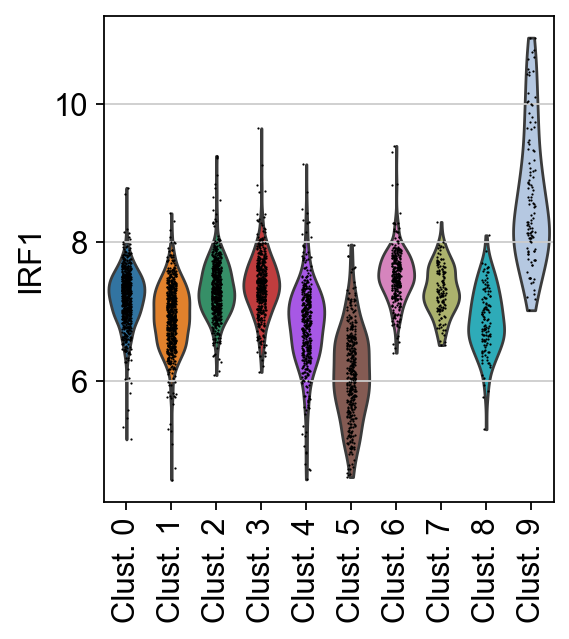

In [38]:
sc.pl.violin(
    acts,
    keys='IRF1',
    groupby='leiden',
    rotation=90
)

Here we observe the activity infered for IRF1 across spots. Interestingly, IRF1 is a known TF crucial for interferons-mediated signaling pathways.
The inference of activities from "foot-prints" of target genes is more informative than just looking at the molecular readouts of a given TF, as an example here is the gene expression of IRF1, which is not very informative by itself:

ここでは、スポット間でIRF1の活性を観察した。興味深いことに、IRF1はインターフェロンを介するシグナル伝達経路に重要なTFとして知られている。標的遺伝子の "足跡 "から活性を推測することは、あるTFの分子的リードアウトを見るよりも有益である：

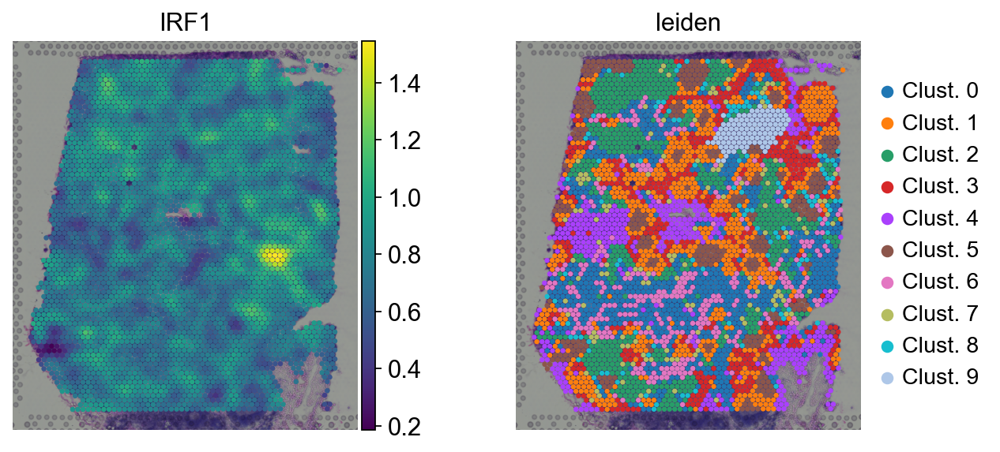

In [39]:
sc.pl.spatial(
    adata,
    color=['IRF1', 'leiden'],
    size=1.5,
    frameon=False
)

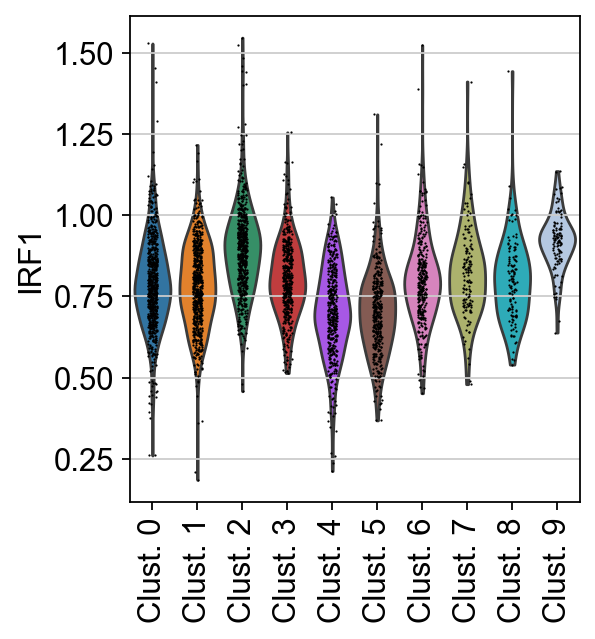

In [40]:
sc.pl.violin(
    adata,
    keys='IRF1',
    groupby='leiden',
    rotation=90
)

### Exploration

Let's identify which are the top TF per cluster. We can do it by using the function `dc.rank_sources_groups`, which identifies marker TFs using the same statistical tests available in scanpy's `scanpy.tl.rank_genes_groups`.

クラスターごとに、どのTFがトップかを特定しよう。これは、scanpyのscanpy.tl.rank_genes_groupsで利用可能なのと同じ統計的検定を使ってマーカーTFを特定します。

In [41]:
df = dc.rank_sources_groups(
    acts, groupby='leiden',
    reference='rest', method='t-test_overestim_var'
)

In [42]:
df.head()

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,Clust. 0,rest,ATF6,27.274293,0.797065,3.891592e-133,1.389298e-130
1,Clust. 0,rest,XBP1,27.060264,0.769147,1.540368e-131,3.666076e-129
2,Clust. 0,rest,GSC,25.738278,0.682551,5.781647e-121,1.032024e-118
3,Clust. 0,rest,TBXT,24.379397,0.686705,9.104787e-111,1.300164e-108
4,Clust. 0,rest,PRDM1,24.077959,0.566675,1.295622e-107,1.541790e-105


We can then extract the top 3 markers per cluster:

そして、クラスターごとに上位3つのマーカーを抽出することができる：

In [43]:
n_markers = 3

source_markers = (
    df
    .groupby('group')
    .head(n_markers)
    .groupby('group')['names']
    .apply(lambda x: list(x))
    .to_dict()
)

In [44]:
source_markers

{'Clust. 0': ['ATF6', 'XBP1', 'GSC'],
 'Clust. 1': ['RFX5', 'NFATC3', 'SPIB'],
 'Clust. 2': ['STAT4', 'TRERF1', 'FOXP1'],
 'Clust. 3': ['NFKB2', 'JDP2', 'PBX1'],
 'Clust. 4': ['THRA', 'TTF1', 'HMGA2'],
 'Clust. 5': ['ARID3A', 'ARID1B', 'E2F4'],
 'Clust. 6': ['SPI1', 'CEBPG', 'ZXDC'],
 'Clust. 7': ['MECOM', 'NFIX', 'ERG'],
 'Clust. 8': ['E2F3', 'E2F4', 'E2F2'],
 'Clust. 9': ['POU2F3', 'ZNF148', 'IRF9']}

We can plot the obtained markers:

得られたマーカーをプロットすることができる：

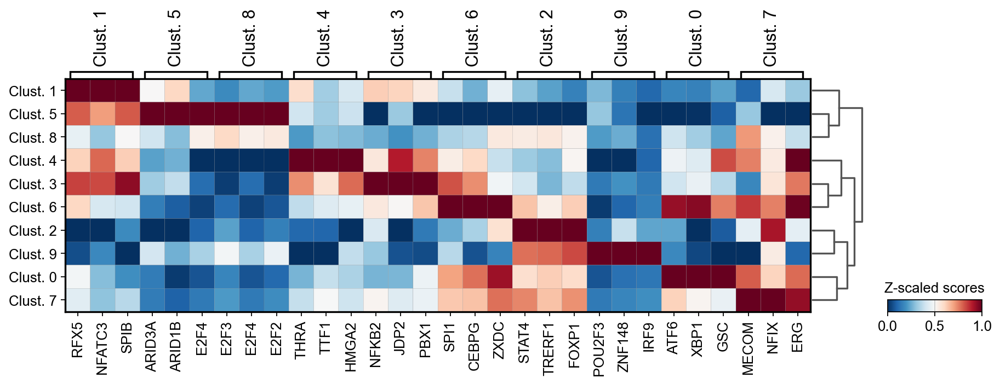

In [45]:
sc.pl.matrixplot(
    acts, source_markers, 'leiden',
    dendrogram=True, standard_scale='var',
    colorbar_title='Z-scaled scores', cmap='RdBu_r'
)

We can visualize again on the tissue some marker TFs:

いくつかのマーカーTFを組織上で再び可視化することができる：

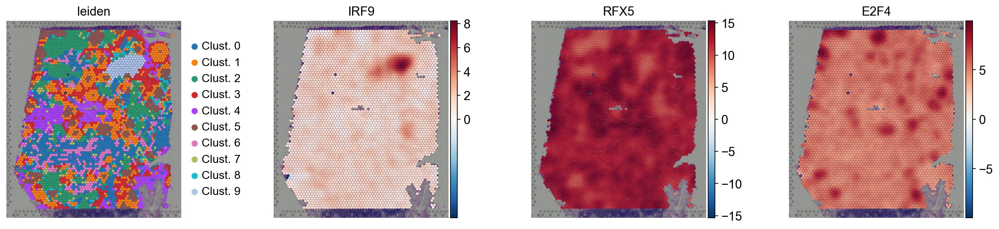

In [46]:
sc.pl.spatial(
    acts,
    color=['leiden', 'IRF9', 'RFX5', 'E2F4'],
    cmap='RdBu_r',
    size=1.5,
    vcenter=0,
    frameon=False
)

## Pathway activity inference

We can also infer pathway activities from our transcriptomics data.

### PROGENy model

[PROGENy](https://saezlab.github.io/progeny/) is a comprehensive resource containing a curated collection of pathways and their target genes, with weights for each interaction.
For this example we will use the human weights (other organisms are available) and we will use the top 500 responsive genes ranked by p-value. Here is a brief description of each pathway:

- **Androgen**: involved in the growth and development of the male reproductive organs.
- **EGFR**: regulates growth, survival, migration, apoptosis, proliferation, and differentiation in mammalian cells
- **Estrogen**: promotes the growth and development of the female reproductive organs.
- **Hypoxia**: promotes angiogenesis and metabolic reprogramming when O2 levels are low.
- **JAK-STAT**: involved in immunity, cell division, cell death, and tumor formation.
- **MAPK**: integrates external signals and promotes cell growth and proliferation.
- **NFkB**: regulates immune response, cytokine production and cell survival.
- **p53**: regulates cell cycle, apoptosis, DNA repair and tumor suppression.
- **PI3K**: promotes growth and proliferation.
- **TGFb**: involved in development, homeostasis, and repair of most tissues.
- **TNFa**: mediates haematopoiesis, immune surveillance, tumour regression and protection from infection.
- **Trail**: induces apoptosis.
- **VEGF**: mediates angiogenesis, vascular permeability, and cell migration.
- **WNT**: regulates organ morphogenesis during development and tissue repair.

To access it we can use `decoupler`.

また、トランスクリプトミクスのデータからパスウェイの活性を推測することもできる。

PROGENyは、パスウェイとその標的遺伝子のキュレーションコレクションを含む包括的なリソースであり、各相互作用の重み付けがなされている。この例ではヒトの重みを使用し（他の生物も利用可能）、p値でランク付けされた上位500の応答遺伝子を使用する。以下に各経路の簡単な説明をする：

- アンドロゲン：男性生殖器の成長と発達に関与する。
- EGFR：哺乳類細胞の成長、生存、遊走、アポトーシス、増殖、分化を制御する。
- エストロゲン：女性の生殖器の成長と発達を促進する。
- 低酸素：酸素濃度が低い場合、血管新生と代謝の再プログラミングを促進する。
- JAK-STAT：免疫、細胞分裂、細胞死、腫瘍形成に関与する。
- MAPK：外部シグナルを統合し、細胞の成長と増殖を促進する。
- NFkB：免疫応答、サイトカイン産生、細胞生存を制御する。
- p53：細胞周期、アポトーシス、DNA修復、腫瘍抑制を制御する。
- PI3K：成長と増殖を促進する。
- TGFb：ほとんどの組織の発生、恒常性維持、修復に関与する。
- TNFa：造血、免疫監視、腫瘍退縮、感染防御を媒介する。
- トレイル：アポトーシスを誘導する。
- VEGF：血管新生、血管透過性、細胞移動を媒介する。
- WNT：発生と組織修復における器官の形態形成を制御する。

これにアクセスするには、decouplerを使用することができる。

In [48]:
progeny = dc.get_progeny(organism='human', top=500)

In [49]:
progeny.head()

,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44
3,Androgen,KLK2,10.176186,1.944414e-40
4,Androgen,SARG,11.386852,2.790209e-40


### Activity inference with Multivariate Linear Model (MLM)

To infer pathway enrichment scores we will run the Multivariate Linear Model (`mlm`) method. For each spot in our slide (`adata`), it fits a linear model that predicts the observed gene expression based on all pathways' Pathway-Gene interactions weights.
Once fitted, the obtained t-values of the slopes are the scores. If it is positive, we interpret that the pathway is active and if it is negative we interpret that it is inactive.
     
We can run `mlm` with a simple one-liner:

パスウェイ濃縮スコアを推測するために、多変量線形モデル（Multivariate Linear Model：mlm）法を実行する。スライドの各スポット（adata）について、すべてのパスウェイのPathway-Gene interactionsの重みに基づいて、観測された遺伝子発現を予測する線形モデルを当てはめる。フィッティング後、得られた傾きのt値がスコアとなる。これが正であればパスウェイは活性であり、負であれば不活性であると解釈できる。

mlmは簡単なワンライナーで実行できる：

In [50]:
dc.run_mlm(
    mat=adata,
    net=progeny,
    source='source',
    target='target',
    weight='weight',
    verbose=True,
    use_raw=False
)

Running mlm on mat with 4032 samples and 19813 targets for 14 sources.


In [51]:
# Store in new obsm keys
adata.obsm['progeny_mlm_estimate'] = adata.obsm['mlm_estimate'].copy()
adata.obsm['progeny_mlm_pvals'] = adata.obsm['mlm_pvals'].copy()

The obtained scores (t-values)(`mlm_estimate`) and p-values (`mlm_pvals`) are stored in the `.obsm` key:

得られたスコア(t値)(mlm_estimate)とp値(mlm_pvals)は.obsmキーに格納される：

In [52]:
adata.obsm['progeny_mlm_estimate'].head()

,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
AAACAAGTATCTCCCA-1,0.726582,2.053643,-1.000791,2.382139,6.987283,-2.039775,-0.701667,-3.040570,0.064892,3.832962,-2.758397,0.119536,0.258799,-4.506958
AAACAATCTACTAGCA-1,0.290293,1.083184,-1.330529,2.192247,7.869349,-2.282048,-0.815248,-3.588149,-0.337527,3.434621,-3.502796,0.230367,0.286088,-4.556517
AAACACCAATAACTGC-1,1.150137,2.426072,-1.008912,2.499938,7.776049,-2.682242,-0.782385,-3.192250,0.019724,3.800170,-3.115057,0.243773,0.280676,-4.311701
AAACAGAGCGACTCCT-1,0.953797,2.201080,-1.045911,1.849993,27.788458,-2.363655,-0.377379,-2.606447,-0.078142,3.240748,-3.111000,0.055545,0.199864,-5.400499
AAACAGCTTTCAGAAG-1,0.525047,1.662629,-1.394363,2.457380,6.697485,-2.214217,-1.591619,-3.209659,-0.590808,3.827923,-2.293087,-0.224759,0.807909,-5.429736


### Visualization

Like in the previous section, we will extract the activities from the `adata` object.

前節と同様に、adataオブジェクトからアクティビティを抽出する。

In [53]:
acts = dc.get_acts(adata, obsm_key='progeny_mlm_estimate')

In [54]:
acts

AnnData object with n_obs × n_vars = 4032 × 14
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes', 'leiden', 'conn'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'leiden_colors', 'dendrogram_leiden'
    obsm: 'spatial', 'X_pca', 'ulm_estimate', 'ulm_pvals', 'collectri_ulm_estimate', 'collectri_ulm_pvals', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals'

Once extracted we can visualize them:

いったん抽出すれば、それを視覚化することができる：

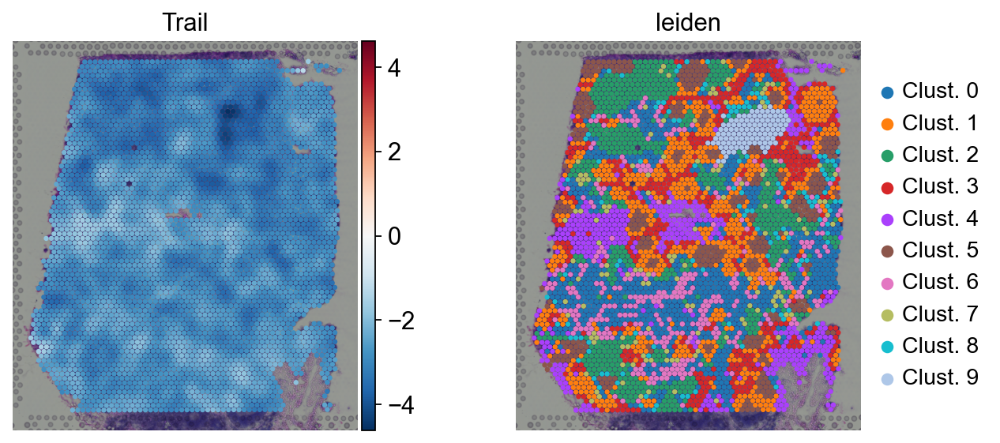

In [55]:
sc.pl.spatial(
    acts,
    color=['Trail', 'leiden'],
    cmap='RdBu_r',
    vcenter=0,
    size=1.5,
    frameon=False
)

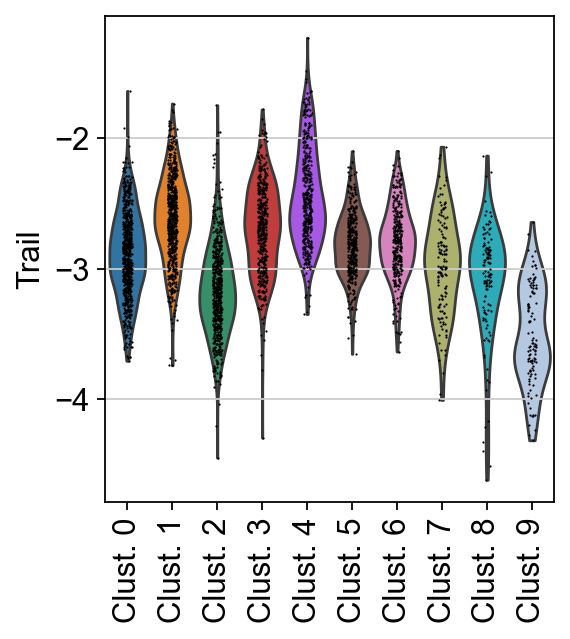

In [56]:
sc.pl.violin(
    acts,
    keys='Trail',
    groupby='leiden',
    rotation=90
)

Here we show the activity of the pathway Trail, which is associated with apoptosis.

ここでは、アポトーシスに関連する経路Trailの活性を示す。

### Exploration

We can visualize which pathways are more active in each cluster:

それぞれのクラスターで、どの経路がより活性化しているかを可視化することができる：

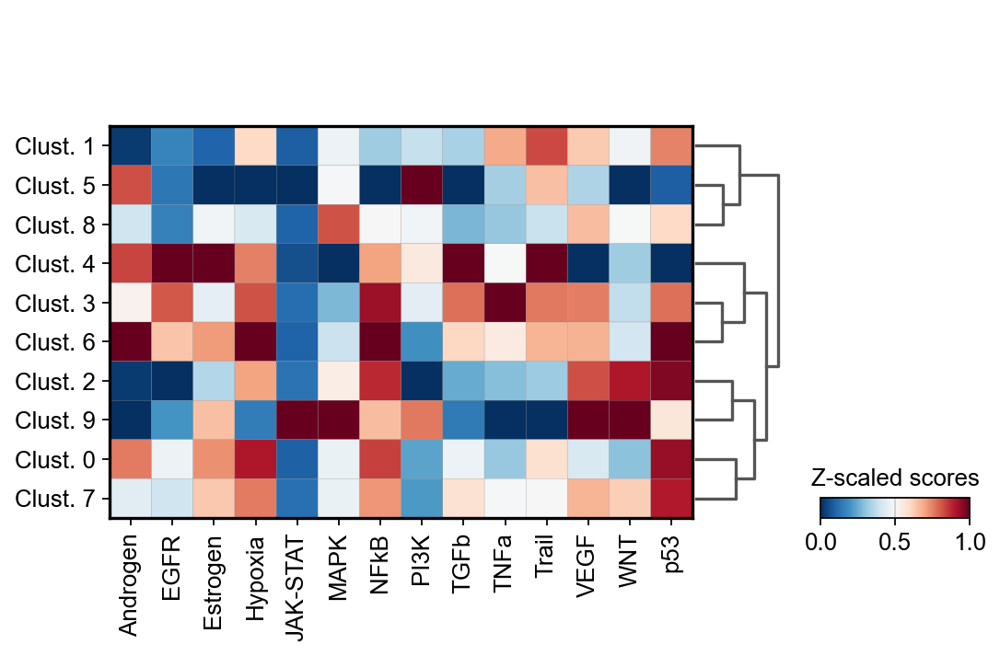

In [57]:
sc.pl.matrixplot(
    acts, var_names=acts.var_names,
    groupby='leiden', dendrogram=True, standard_scale='var',
    colorbar_title='Z-scaled scores', cmap='RdBu_r'
)

We can visualize again on the tissue some cluster-specific pathways:

私たちは、いくつかのクラスター特異的な経路を組織上に再び可視化することができる：

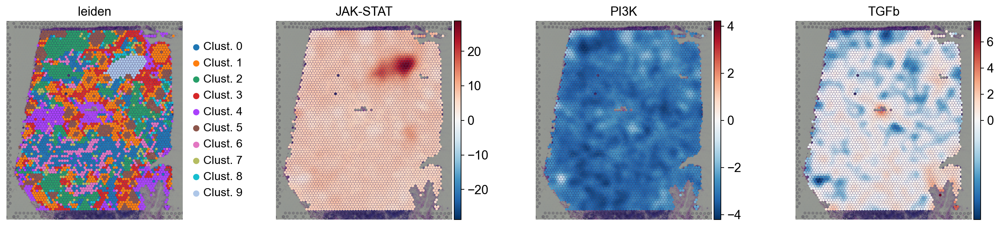

In [58]:
sc.pl.spatial(
    acts,
    color=['leiden', 'JAK-STAT', 'PI3K', 'TGFb'],
    cmap='RdBu_r',
    size=1.5,
    vcenter=0,
    frameon=False
)

## Functional enrichment of biological terms

Finally, we can also infer activities for general biological terms or processes.

### MSigDB gene sets

The Molecular Signatures Database ([MSigDB](http://www.gsea-msigdb.org/gsea/msigdb/)) is a resource containing a collection of gene sets annotated to different biological processes.

最後に、一般的な生物学的用語やプロセスの活性を推測することもできる。

Molecular Signatures Database (MSigDB)は、様々な生物学的プロセスにアノテーションされた遺伝子セットのコレクションを含むリソース。

In [73]:
msigdb = dc.get_resource('MSigDB')

In [74]:
msigdb.head()

,genesymbol,collection,geneset
0,MAFF,chemical_and_genetic_perturbations,BOYAULT_LIVER_CANCER_SUBCLASS_G56_DN
1,MAFF,chemical_and_genetic_perturbations,ELVIDGE_HYPOXIA_UP
2,MAFF,chemical_and_genetic_perturbations,NUYTTEN_NIPP1_TARGETS_DN
3,MAFF,immunesigdb,GSE17721_POLYIC_VS_GARDIQUIMOD_4H_BMDC_DN
4,MAFF,chemical_and_genetic_perturbations,SCHAEFFER_PROSTATE_DEVELOPMENT_12HR_UP


As an example, we will use the hallmark gene sets, but we could have used any other. 

We can filter by for `hallmark`:

例として、ホールマーク遺伝子セットを使うが、他のものでもよい。

hallmarkでフィルターできる：

In [75]:
# Filter by hallmark
msigdb = msigdb[msigdb['collection'] == 'hallmark']

In [76]:
# Remove duplicated entries
msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]

In [77]:
# Rename
msigdb.loc[:, 'geneset'] = [name.split('HALLMARK_')[1] for name in msigdb['geneset']]

In [78]:
msigdb.head()

,genesymbol,collection,geneset
233,MAFF,hallmark,IL2_STAT5_SIGNALING
250,MAFF,hallmark,COAGULATION
270,MAFF,hallmark,HYPOXIA
373,MAFF,hallmark,TNFA_SIGNALING_VIA_NFKB
377,MAFF,hallmark,COMPLEMENT


### Enrichment with Over Representation Analysis (ORA)

To infer functional enrichment scores we will run the Over Representation Analysis (`ora`) method.
As input data it accepts an expression matrix (`decoupler.run_ora`) or the results of differential expression analysis (`decoupler.run_ora_df`).
For the former, by default the top 5% of expressed genes by sample are selected as the set of interest (S*), and for the latter a user-defined
significance filtering can be used.
Once we have S*, it builds a contingency table using set operations for each set stored in the gene set resource being used (`net`).
Using the contingency table, `ora` performs a one-sided Fisher exact test to test for significance of overlap between sets.
The final score is obtained by log-transforming the obtained p-values, meaning that higher values are more significant.
     
We can run `ora` with a simple one-liner:

機能的濃縮スコアを推測するために、Over Representation Analysis (ora)メソッドを実行する。入力データとして、発現行列(decoupler.run_ora)または差分発現解析結果(decoupler.run_ora_df)を受け取る。前者では、デフォルトでサンプルごとの発現遺伝子の上位5％が注目セット（S*）として選択され、後者ではユーザー定義の有意性フィルタリングを使用できる。S*が得られたら、使用する遺伝子セットリソース（net）に格納されている各セットについて、セット操作を使用して分割表を作成する。分割表を用いて、oraはセット間の重複の有意性を検定するために片側フィッシャー正確検定を実行する。最終的なスコアは得られたp値を対数変換することで得られ、値が大きいほど有意であることを意味する。

oraは簡単なワンライナーで実行できる：

In [79]:
dc.run_ora(
    mat=adata,
    net=msigdb,
    source='geneset',
    target='genesymbol',
    verbose=True,
    use_raw=False
)

Running ora on mat with 4032 samples and 19813 targets for 50 sources.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4032/4032 [00:08<00:00, 453.45it/s]


In [80]:
# Store in a different key
adata.obsm['msigdb_ora_estimate'] = adata.obsm['ora_estimate'].copy()
adata.obsm['msigdb_ora_pvals'] = adata.obsm['ora_pvals'].copy()

The obtained scores (-log10(p-value))(`ora_estimate`) and p-values (`ora_pvals`) are stored in the `.obsm` key:

得られたスコア(-log10(p-value))(ora_estimate)とp値(ora_pvals)は.obsmキーに格納される：

In [81]:
adata.obsm['msigdb_ora_estimate'].iloc[:, 0:5].head()

source,ADIPOGENESIS,ALLOGRAFT_REJECTION,ANDROGEN_RESPONSE,ANGIOGENESIS,APICAL_JUNCTION
AAACAAGTATCTCCCA-1,2.853878,27.778801,3.050313,0.626249,4.373918
AAACAATCTACTAGCA-1,1.824514,28.717391,1.688825,0.626249,3.082310
AAACACCAATAACTGC-1,3.242752,25.935842,2.558473,0.626249,3.491148
AAACAGAGCGACTCCT-1,1.824514,31.600349,3.050313,0.294479,1.994681
AAACAGCTTTCAGAAG-1,3.242752,21.533596,2.558473,0.294479,3.082310


### Visualization

Like in the previous sections, we will extract the activities from the `adata` object.

これまでのセクションと同様に、adataオブジェクトからアクティビティを抽出する。

In [82]:
acts = dc.get_acts(adata, obsm_key='msigdb_ora_estimate')

In [83]:
# We need to remove inf and set them to the maximum value observed
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

In [84]:
acts

AnnData object with n_obs × n_vars = 4032 × 50
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes', 'leiden', 'conn'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'leiden_colors', 'dendrogram_leiden'
    obsm: 'spatial', 'X_pca', 'ulm_estimate', 'ulm_pvals', 'collectri_ulm_estimate', 'collectri_ulm_pvals', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals', 'ora_estimate', 'ora_pvals', 'msigdb_ora_estimate', 'msigdb_ora_pvals'

Once extracted we can visualize them:

いったん抽出すれば、それを視覚化することができる：

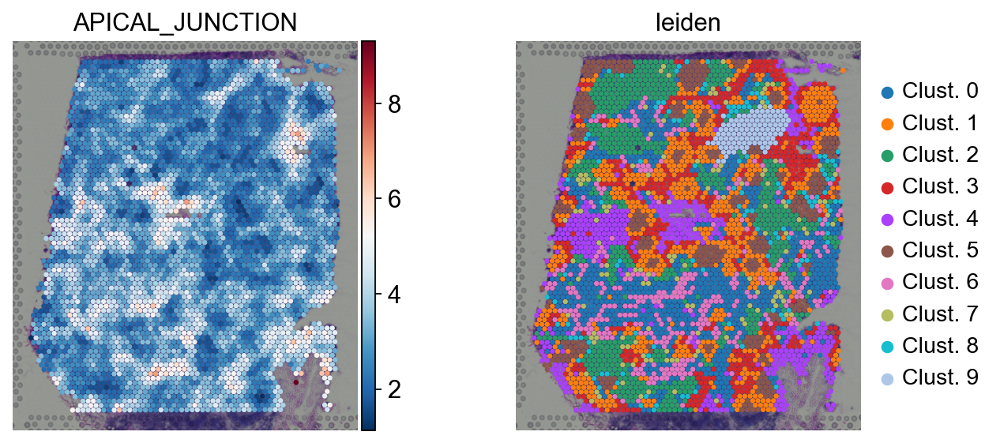

In [85]:
sc.pl.spatial(
    acts,
    color=['APICAL_JUNCTION', 'leiden'],
    cmap='RdBu_r',
    size=1.5,
    frameon=False
)

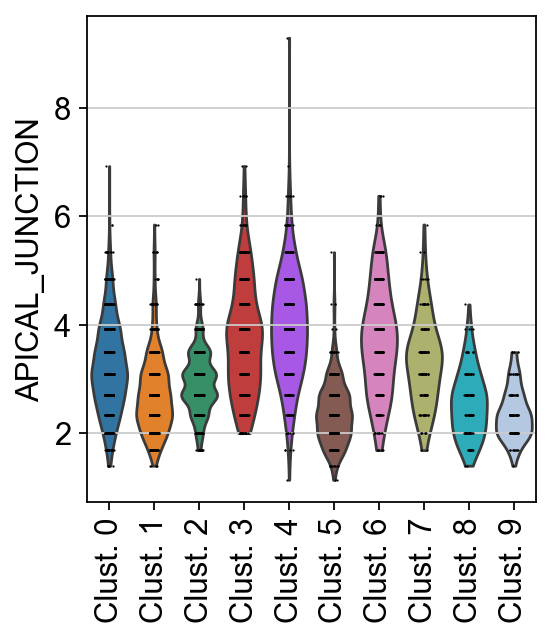

In [86]:
sc.pl.violin(
    acts,
    keys='APICAL_JUNCTION',
    groupby='leiden',
    rotation=90
)

### Exploration

Let's identify which are the top terms per cluster. We can do it by using the function `dc.rank_sources_groups`, as shown before.

クラスターごとに上位の用語を特定しよう。前述したように、dc.rank_sources_groups関数を使用する。

In [87]:
df = dc.rank_sources_groups(
    acts, groupby='leiden',
    reference='rest', method='t-test_overestim_var'
)

In [88]:
df.head()

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,Clust. 0,rest,UNFOLDED_PROTEIN_RESPONSE,12.109488,0.735034,2.996527e-32,1.498264e-30
1,Clust. 0,rest,UV_RESPONSE_UP,10.060619,0.477651,4.601165e-23,7.668609e-22
2,Clust. 0,rest,HYPOXIA,8.808346,0.674427,3.794931e-18,3.794931e-17
3,Clust. 0,rest,MTORC1_SIGNALING,8.241573,0.684992,3.694256e-16,2.638754e-15
4,Clust. 0,rest,TNFA_SIGNALING_VIA_NFKB,7.936175,1.167170,4.308307e-15,2.692692e-14


We can then extract the top 3 terms per cluster:

そして、クラスターごとに上位3項を抽出することができる：

In [89]:
n_top = 3

term_markers = (
    df
    .groupby('group')
    .head(n_top)
    .groupby('group')['names']
    .apply(lambda x: list(x))
    .to_dict()
)

In [90]:
term_markers

{'Clust. 0': ['UNFOLDED_PROTEIN_RESPONSE', 'UV_RESPONSE_UP', 'HYPOXIA'],
 'Clust. 1': ['NOTCH_SIGNALING',
  'IL2_STAT5_SIGNALING',
  'PI3K_AKT_MTOR_SIGNALING'],
 'Clust. 2': ['WNT_BETA_CATENIN_SIGNALING',
  'ALLOGRAFT_REJECTION',
  'APOPTOSIS'],
 'Clust. 3': ['IL2_STAT5_SIGNALING', 'APICAL_SURFACE', 'TGF_BETA_SIGNALING'],
 'Clust. 4': ['EPITHELIAL_MESENCHYMAL_TRANSITION',
  'HEDGEHOG_SIGNALING',
  'APICAL_JUNCTION'],
 'Clust. 5': ['E2F_TARGETS', 'G2M_CHECKPOINT', 'MYC_TARGETS_V1'],
 'Clust. 6': ['COAGULATION', 'TNFA_SIGNALING_VIA_NFKB', 'COMPLEMENT'],
 'Clust. 7': ['COAGULATION', 'KRAS_SIGNALING_UP', 'TGF_BETA_SIGNALING'],
 'Clust. 8': ['MYC_TARGETS_V1', 'E2F_TARGETS', 'G2M_CHECKPOINT'],
 'Clust. 9': ['INTERFERON_GAMMA_RESPONSE',
  'INTERFERON_ALPHA_RESPONSE',
  'KRAS_SIGNALING_DN']}

We can plot the obtained terms:

得られた項をプロットすることができる：

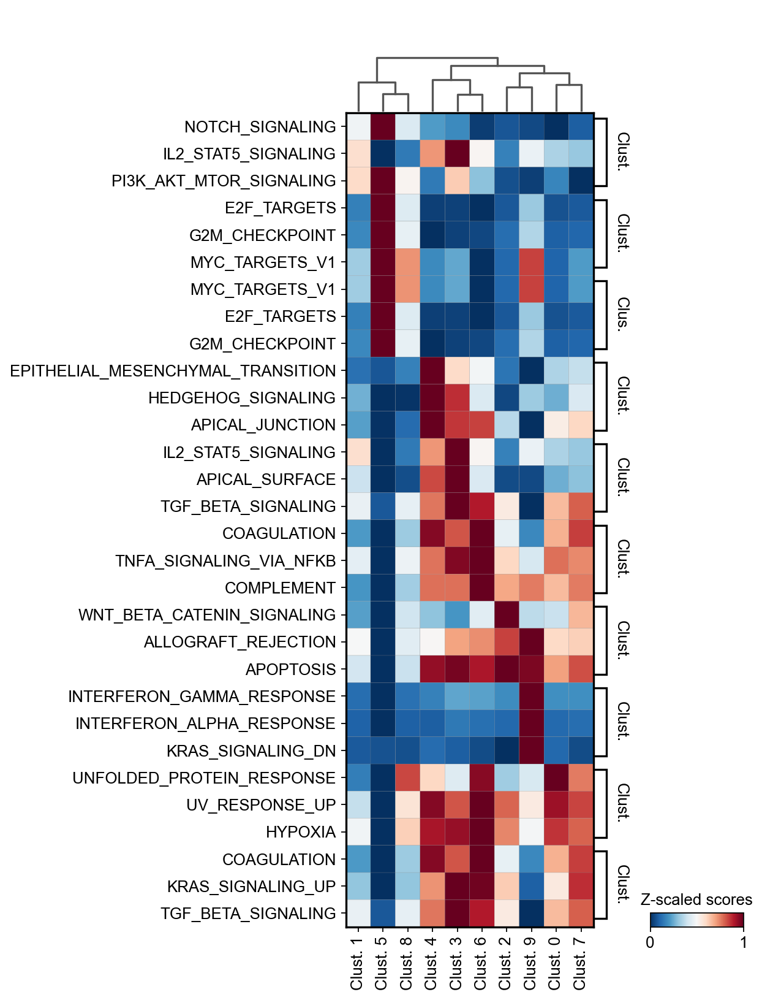

In [91]:
sc.pl.matrixplot(
    acts, term_markers, 'leiden',
    dendrogram=True, standard_scale='var',
    colorbar_title='Z-scaled scores', cmap='RdBu_r',
    swap_axes=True
)

We can visualize again on the tissue some cluster-specific terms:

クラスター特有の用語を組織上に再度可視化することができる：

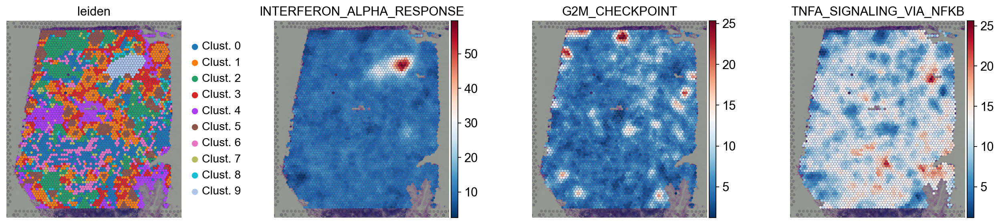

In [93]:
sc.pl.spatial(
    acts,
    color=[
        'leiden', 'INTERFERON_ALPHA_RESPONSE',
        'G2M_CHECKPOINT', 'TNFA_SIGNALING_VIA_NFKB'
    ],
    cmap='RdBu_r',
    size=1.5,
    frameon=False
)